## Stereo Camera Calibration

In [1]:
import cv2
import numpy as np
import glob          
import os           
import matplotlib.pyplot as plt

In [2]:
chessboard_size = (9, 6)  
square_size = 25  

# Generate 3D coordinates of chessboard corners spaced by square_size on the XY-plane for calibration
objp = np.zeros((chessboard_size[0]*chessboard_size[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)
objp *= square_size
print(objp)

# arrays to store object points and image points from left and right images
objpoints = []        # 3d points in real world space (same for both cameras)
imgpoints_left = []   # 2d points in left image plane
imgpoints_right = []  # 2d points in right image plane

[[  0.   0.   0.]
 [ 25.   0.   0.]
 [ 50.   0.   0.]
 [ 75.   0.   0.]
 [100.   0.   0.]
 [125.   0.   0.]
 [150.   0.   0.]
 [175.   0.   0.]
 [200.   0.   0.]
 [  0.  25.   0.]
 [ 25.  25.   0.]
 [ 50.  25.   0.]
 [ 75.  25.   0.]
 [100.  25.   0.]
 [125.  25.   0.]
 [150.  25.   0.]
 [175.  25.   0.]
 [200.  25.   0.]
 [  0.  50.   0.]
 [ 25.  50.   0.]
 [ 50.  50.   0.]
 [ 75.  50.   0.]
 [100.  50.   0.]
 [125.  50.   0.]
 [150.  50.   0.]
 [175.  50.   0.]
 [200.  50.   0.]
 [  0.  75.   0.]
 [ 25.  75.   0.]
 [ 50.  75.   0.]
 [ 75.  75.   0.]
 [100.  75.   0.]
 [125.  75.   0.]
 [150.  75.   0.]
 [175.  75.   0.]
 [200.  75.   0.]
 [  0. 100.   0.]
 [ 25. 100.   0.]
 [ 50. 100.   0.]
 [ 75. 100.   0.]
 [100. 100.   0.]
 [125. 100.   0.]
 [150. 100.   0.]
 [175. 100.   0.]
 [200. 100.   0.]
 [  0. 125.   0.]
 [ 25. 125.   0.]
 [ 50. 125.   0.]
 [ 75. 125.   0.]
 [100. 125.   0.]
 [125. 125.   0.]
 [150. 125.   0.]
 [175. 125.   0.]
 [200. 125.   0.]]


- `objp` creates a zero-initialized array with rows equal to the total number of chessboard corners `(9 * 6 = 54)` and `3` columns for 3D coordinates (X, Y, Z).
- `np.mgrid[0:9, 0:6]` generates a dense multi-dimensional mesh grid of coordinates representing all (X, Y) corner positions in the chessboard grid.
- `.T.reshape(-1, 2)` reshapes this grid into a list of (X, Y) pairs, flattening the 2D grid into a 1D list of points.
    - Transposes the array, swapping axes so it's easier to match each (x, y) corner.
    - 2 means reshape the array so it has 2 columns, -1 means figure out the number of rows automatically to fit all the data.
- `objp[:, :2] = ...` assigns these (X, Y) pairs to the first two columns of objp, leaving Z as zero since the chessboard is flat on the XY plane.
- `objpoints` stores repeated copies of the known 3D corner locations (from objp) for each successful calibration image.
- `imgpoints_left` and `imgpoints_right` store the detected 2D pixel coordinates of those corners in the left and right camera images, respectively.

The collected 3D-2D correspondences help estimate both intrinsic camera parameters and the relative position and orientation (extrinsics) between the stereo cameras.

### Corner Detection of chessboard images

- OpenCV provides a builtin function called `findChessboardCorners` that looks for a checkerboard and returns the coordinates of the corners. 
- OpenCV’s function `cornerSubPix` takes in the original image, and the location of corners, and looks for the best corner location inside a small neighborhood of the original location. 
- The algorithm is iterative in nature and therefore we need to specify the termination criteria 

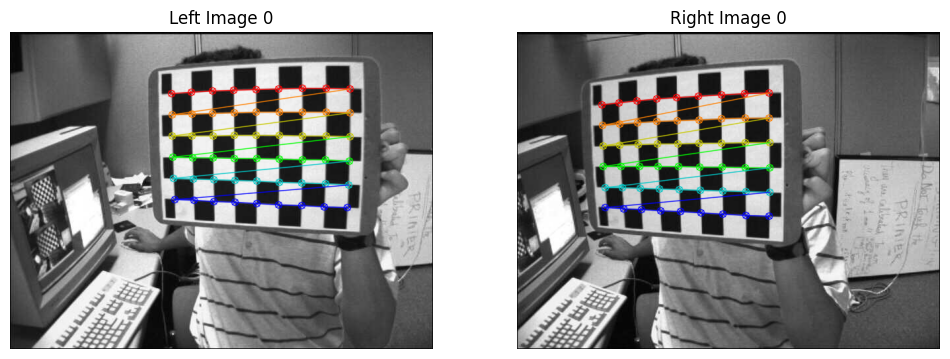

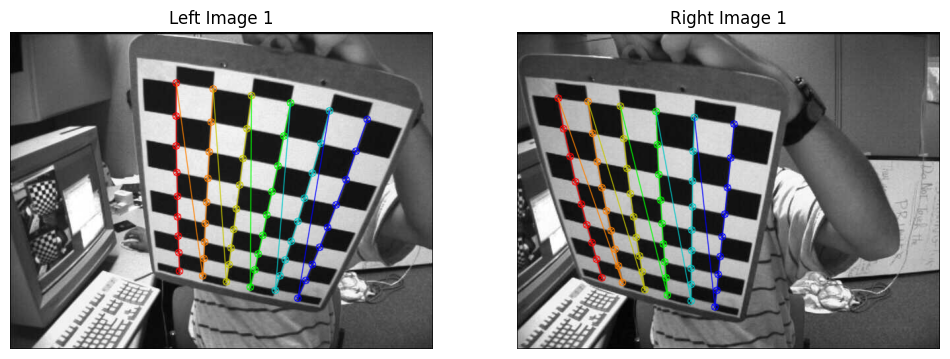

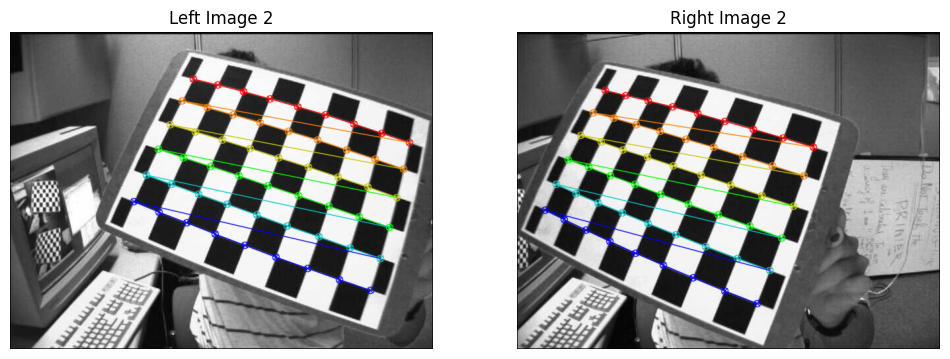

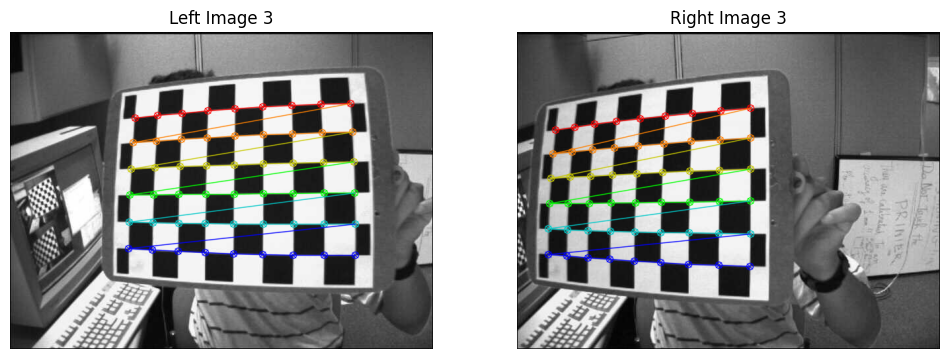

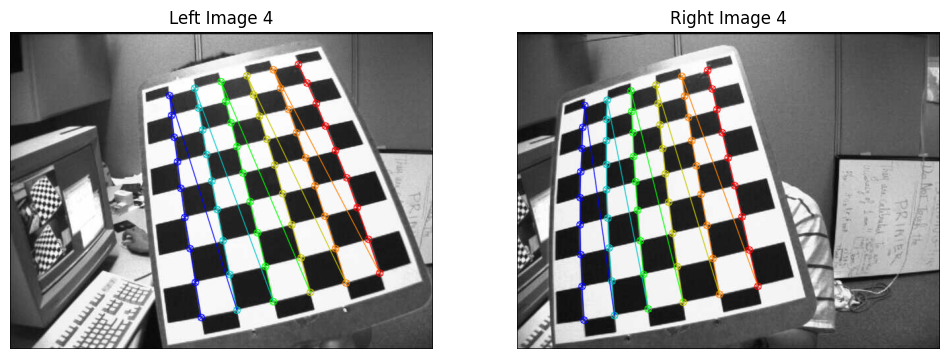

...

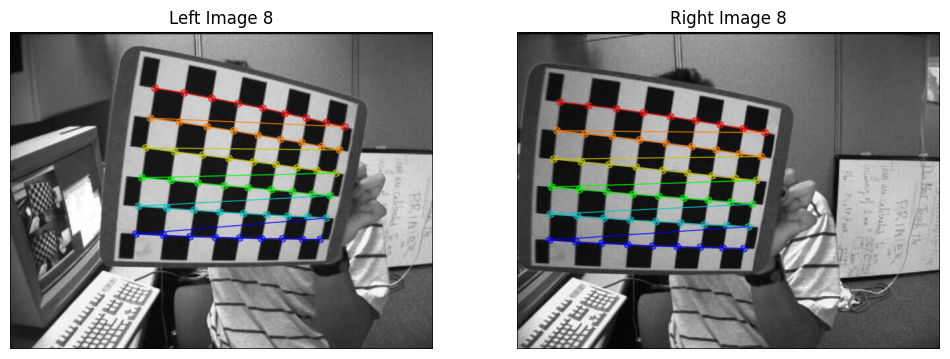

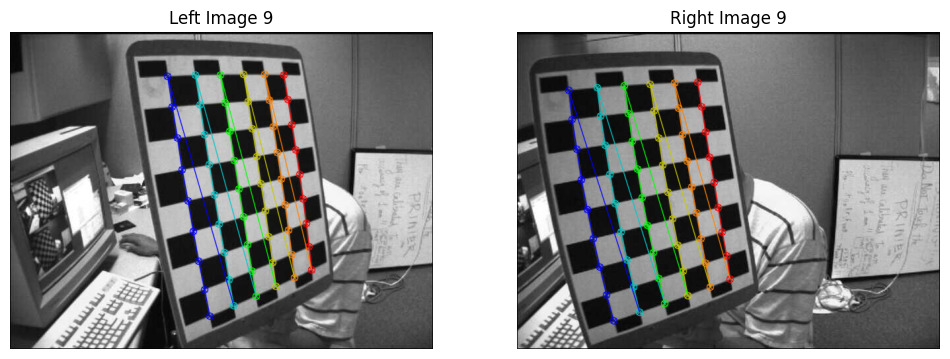

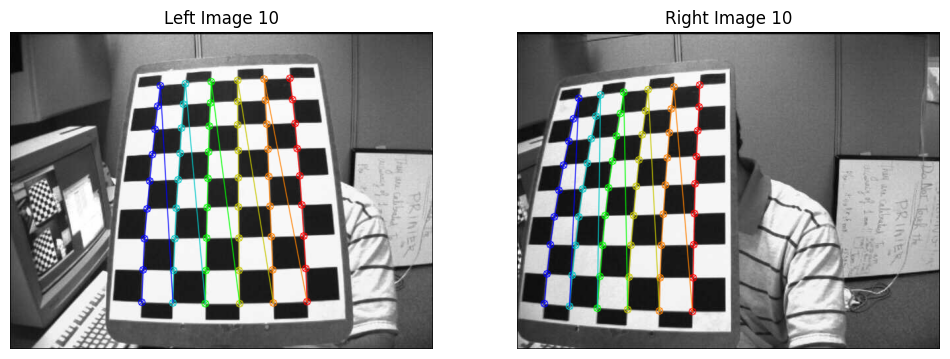

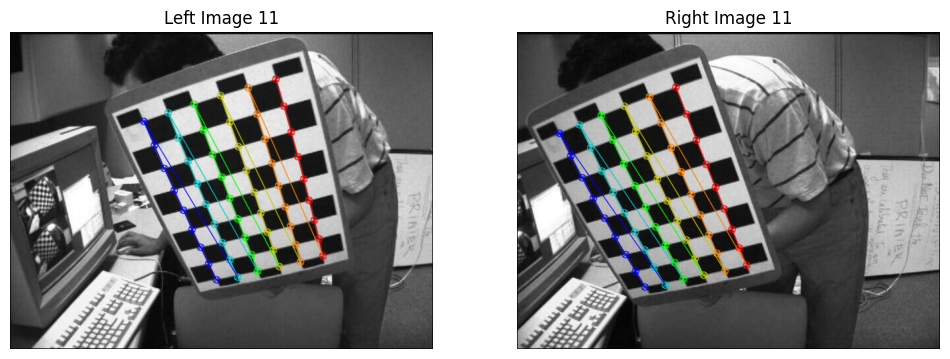

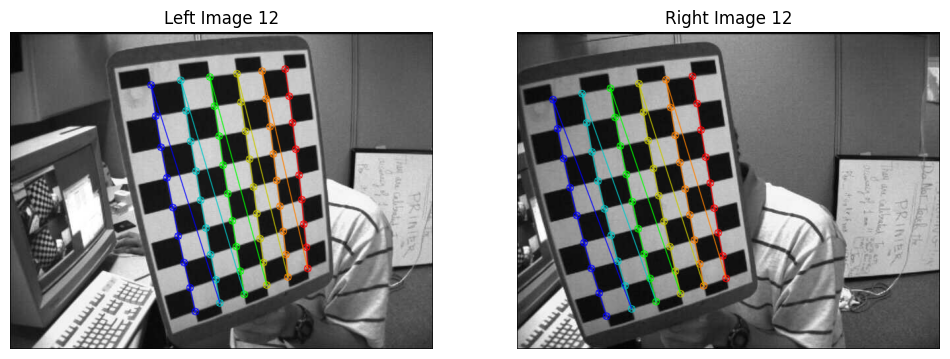

In [3]:
left_images = sorted(glob.glob('left_images/*.jpg')) 
right_images = sorted(glob.glob('right_images/*.jpg')) 

assert len(left_images) == len(right_images), "Number of left and right images must be equal"

for i in range(len(left_images)):
    img_left = cv2.imread(left_images[i])
    img_right = cv2.imread(right_images[i])
    gray_left = cv2.cvtColor(img_left, cv2.COLOR_BGR2GRAY)
    gray_right = cv2.cvtColor(img_right, cv2.COLOR_BGR2GRAY)

    ret_left, corners_left = cv2.findChessboardCorners(gray_left, chessboard_size, None)
    ret_right, corners_right = cv2.findChessboardCorners(gray_right, chessboard_size, None)

    if ret_left and ret_right:
        objpoints.append(objp)

        corners_left_subpix = cv2.cornerSubPix(
            gray_left, corners_left, (11, 11), (-1, -1),
            criteria=(cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001))
        corners_right_subpix = cv2.cornerSubPix(
            gray_right, corners_right, (11, 11), (-1, -1),
            criteria=(cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001))

        imgpoints_left.append(corners_left_subpix)
        imgpoints_right.append(corners_right_subpix)

        # visualize corner detection for verification
        img_left_corners = cv2.drawChessboardCorners(img_left.copy(), chessboard_size, corners_left_subpix, ret_left)
        img_right_corners = cv2.drawChessboardCorners(img_right.copy(), chessboard_size, corners_right_subpix, ret_right)

        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img_left_corners, cv2.COLOR_BGR2RGB))
        plt.title(f'Left Image {i}')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(img_right_corners, cv2.COLOR_BGR2RGB))
        plt.title(f'Right Image {i}')
        plt.axis('off')

        plt.show()

    else:
        print(f"Corners not found in pair {i}: Left found={ret_left}, Right found={ret_right}")


- `cv2.cornerSubPix`: Refines corner locations detected by `cv2.findChessboardCorners` to subpixel accuracy, improving the precision of corner detection for better calibration results.
- `cv2.TERM_CRITERIA_MAX_ITER`: A termination criterion flag indicating that an iterative algorithm should stop after reaching the maximum number of iterations.
- `cv2.TERM_CRITERIA_EPS`:  A termination criterion flag indicating that an iterative algorithm should stop when the specified accuracy (epsilon) is reached.

### Calibration

Calibration is to pass the 3D points in world coordinates and their 2D locations in all images to OpenCV’s `calibrateCamera` method. The implementation is based on a paper by Zhengyou Zhang.

In [4]:
if len(objpoints) == 0:
    raise ValueError("No valid chessboard corners found in image pairs, cannot calibrate.")

image_shape = gray_left.shape[::-1]  # width, height


cameraMatrix1 = None
distCoeffs1 = None
cameraMatrix2 = None
distCoeffs2 = None

flags = cv2.CALIB_FIX_INTRINSIC 

criteria = (cv2.TERM_CRITERIA_MAX_ITER + cv2.TERM_CRITERIA_EPS, 100, 1e-5)

# ret: The root mean square (RMS) reprojection error measuring how well the calibration fits the data; lower means better calibration.
# cameraMatrix1 & cameraMatrix2: Estimated intrinsic camera matrices for left and right cameras.
# distCoeffs1 & distCoeffs2: Estimated distortion coefficients for each camera.
# R: Rotation matrix describing how the right camera is rotated relative to the left camera.
# T: Translation vector describing the position of the right camera relative to the left camera.
# E: Essential matrix encodes the rotation and translation between two calibrated cameras, representing how points in 3D space relate between the camera coordinate systems. It captures the stereo geometry assuming intrinsic parameters are known.
# F: Fundamental matrix encodes the epipolar geometry between two uncalibrated camera views by mapping points in one image to corresponding epipolar lines in the other. It expresses the intrinsic-extrinsic relationship without requiring camera calibration.


ret, cameraMatrix1, distCoeffs1, cameraMatrix2, distCoeffs2, R, T, E, F = cv2.stereoCalibrate(
    objpoints,         # List of known 3D points in the world (chessboard corners).
    imgpoints_left,    # 2D image points detected in the left camera images.
    imgpoints_right,   # 2D image points detected in the right camera images.
    cameraMatrix1,     # Initial estimates of intrinsic camera matrices or None if unknown.
    distCoeffs1,       # Initial distortion coefficients or None.
    cameraMatrix2,     # Initial estimates of intrinsic camera matrices or None if unknown.
    distCoeffs2,       # Initial distortion coefficients or None.
    image_shape,       # Image size as (width, height)
    criteria=criteria, # Termination criteria for optimization.
    flags=0            # Indicates all parameters (intrinsics and extrinsics) will be optimized.
)

print("Stereo calibration RMS error:", ret)
print("Left camera matrix:\n", cameraMatrix1)
print("Right camera matrix:\n", cameraMatrix2)
print("Rotation between cameras:\n", R)
print("Translation between cameras:\n", T)


Stereo calibration RMS error: 0.4453608098493027
Left camera matrix:
 [[536.17288646   0.         342.49513851]
 [  0.         536.00063377 235.48276852]
 [  0.           0.           1.        ]]
Right camera matrix:
 [[540.30273313   0.         328.04069305]
 [  0.         539.83279537 247.18180773]
 [  0.           0.           1.        ]]
Rotation between cameras:
 [[ 9.99984029e-01  4.09958735e-03  3.89045104e-03]
 [-4.09677756e-03  9.99991342e-01 -7.29922835e-04]
 [-3.89340974e-03  7.13972865e-04  9.99992166e-01]]
Translation between cameras:
 [[-83.49219873]
 [  1.00565213]
 [  0.18038868]]


- `cv2.CALIB_FIX_INTRINSIC`: A flag used in stereo calibration to keep the intrinsic camera parameters fixed during the calibration process. This means the calibration will only optimize the extrinsic parameters (rotation and translation between cameras) and distortion coefficients, assuming that the intrinsic parameters are already known and accurate.

In [5]:
# R1 and R2: These rotate the camera coordinate systems to make the image planes coplanar and aligned horizontally.
# P1 and P2: New projection matrices for the left and right cameras after rectification.
# Q: This 4×4 matrix is used to reproject disparity values (pixel differences between rectified images) back into 3D space (depth).
# roi1 and roi2: Regions of interest (ROIs) for the valid parts of the rectified images for left and right cameras.
# alpha=0: Controls the amount of blank pixels in the rectified images

R1, R2, P1, P2, Q, roi1, roi2 = cv2.stereoRectify(
    cameraMatrix1, distCoeffs1,
    cameraMatrix2, distCoeffs2,
    image_shape, R, T,
    flags=cv2.CALIB_ZERO_DISPARITY,
    alpha=0
)

print("Rectification transform for left camera:\n", R1)
print("Rectification transform for right camera:\n", R2)


Rectification transform for left camera:
 [[ 9.99966918e-01 -7.94611939e-03  1.73858431e-03]
 [ 7.94672995e-03  9.99968365e-01 -3.44556191e-04]
 [-1.73579142e-03  3.58360852e-04  9.99998429e-01]]
Rectification transform for right camera:
 [[ 9.99925135e-01 -1.20439616e-02 -2.16038356e-03]
 [ 1.20447202e-02  9.99927402e-01  3.38456911e-04]
 [ 2.15615036e-03 -3.64452788e-04  9.99997609e-01]]


- `cv2.stereoRectify`: Computes transforms to align stereo camera images so matching points lie on the same horizontal lines for easier depth calculation.
- `cv2.CALIB_ZERO_DISPARITY`:  is a flag that ensures zero vertical disparity after rectification, making corresponding points perfectly aligned horizontally.

### Undistortion and Rectification of images

Undistortion and rectification correct lens distortion and geometrically transform stereo image pairs so their epipolar lines are horizontally aligned. This process passes intrinsic parameters, distortion coefficients, and stereo calibration results (rotation, translation) to OpenCV’s `initUndistortRectifyMap` and `remap` functions. It enables accurate pixel correspondence for disparity calculation by warping images into a common, rectified camera plane.

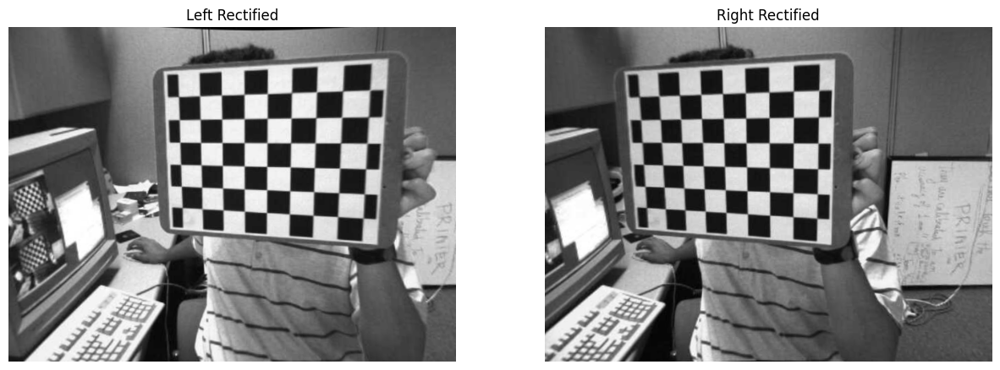

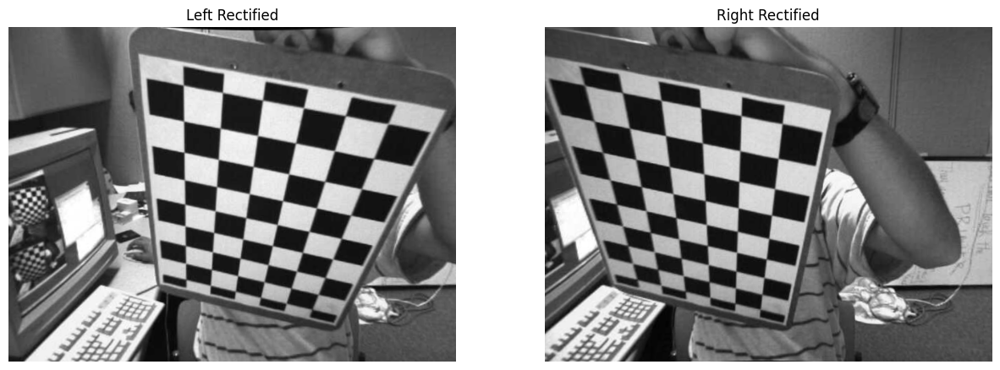

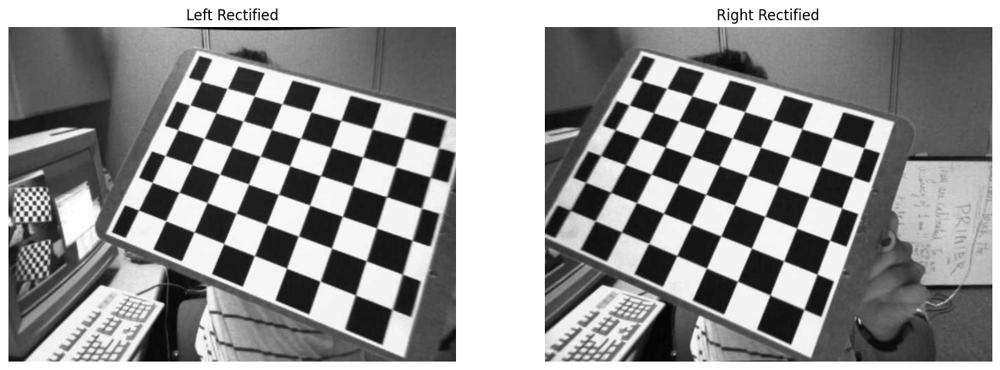

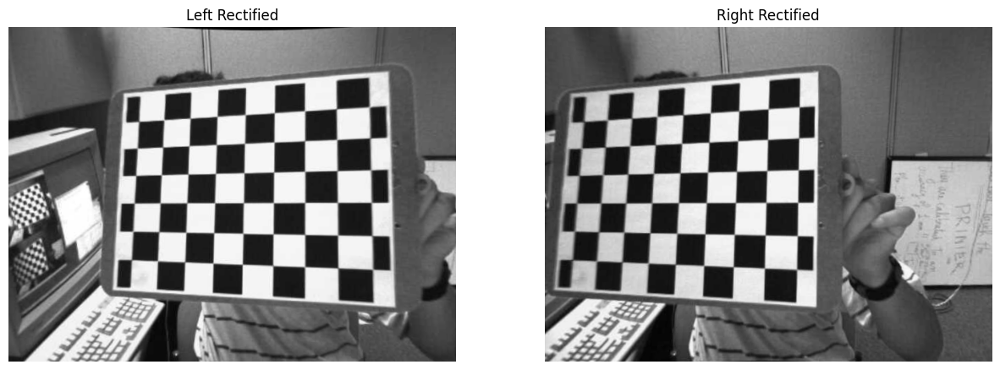

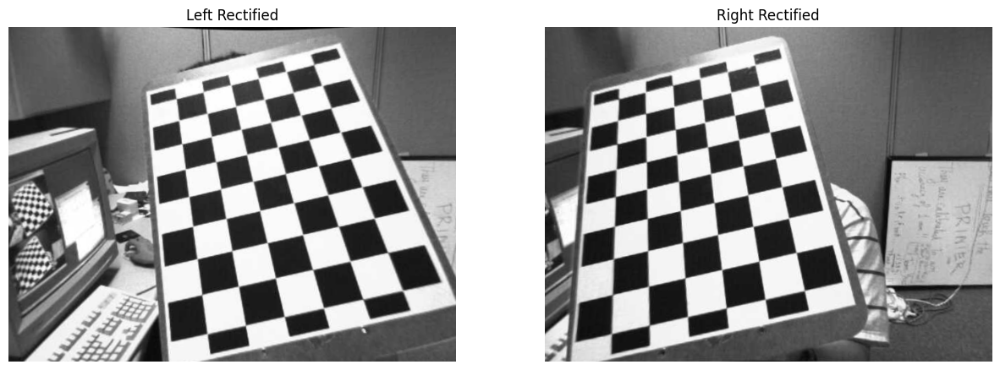

...

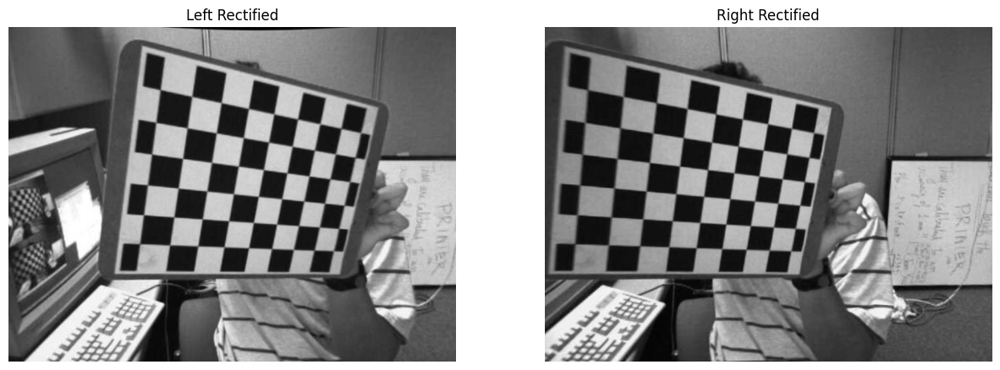

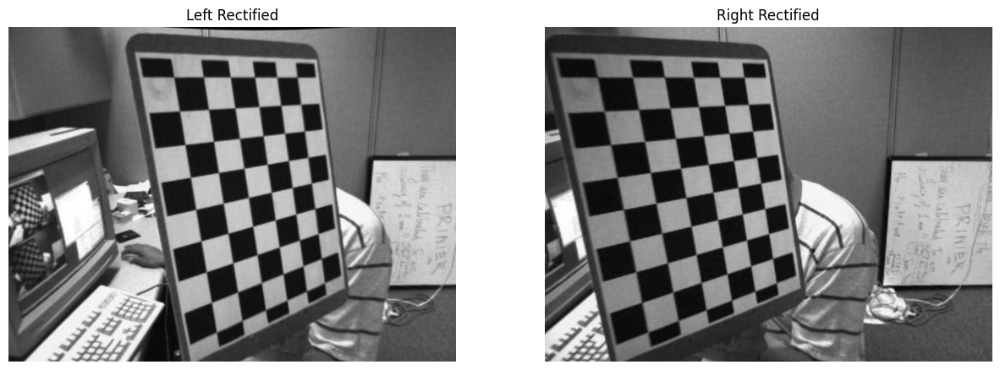

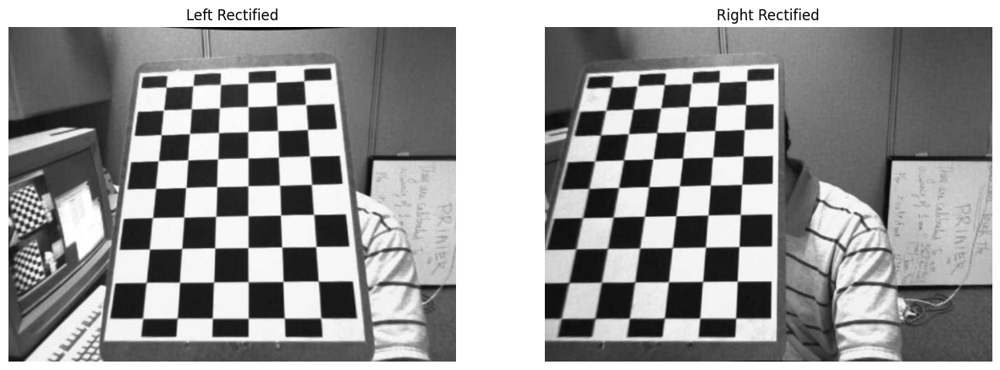

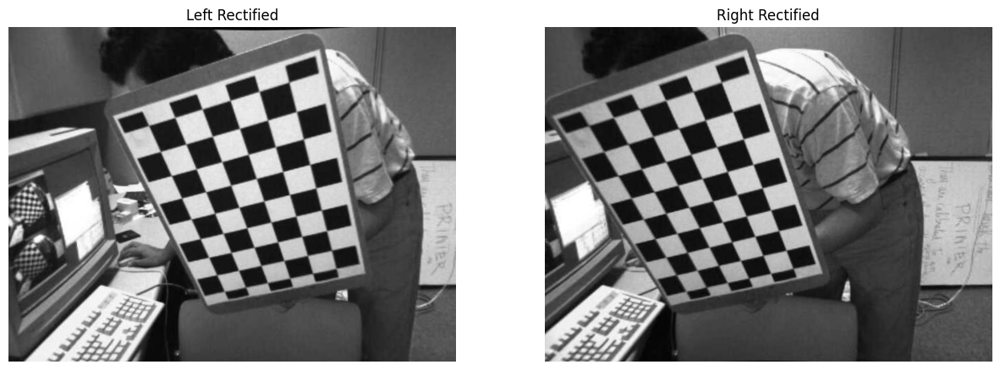

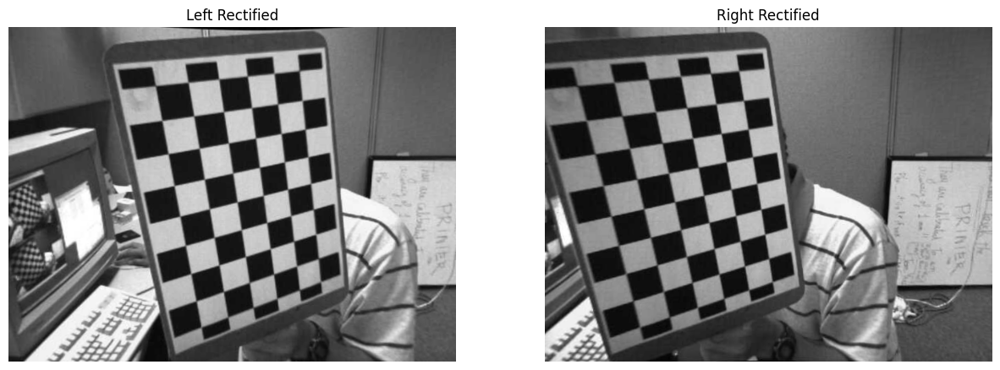

In [6]:
for i in range(len(left_images)):
    img_left = cv2.imread(left_images[i])
    img_right = cv2.imread(right_images[i])
    h, w = img_left.shape[:2]

    # Compute undistortion and rectification maps for both cameras
    left_map1, left_map2 = cv2.initUndistortRectifyMap(
        cameraMatrix1, distCoeffs1, R1, P1, (w, h), cv2.CV_16SC2)
    right_map1, right_map2 = cv2.initUndistortRectifyMap(
        cameraMatrix2, distCoeffs2, R2, P2, (w, h), cv2.CV_16SC2)

    left_rectified = cv2.remap(img_left, left_map1, left_map2, cv2.INTER_LINEAR)
    right_rectified = cv2.remap(img_right, right_map1, right_map2, cv2.INTER_LINEAR)

    import matplotlib.pyplot as plt

    plt.figure(figsize=(15,6))
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(left_rectified, cv2.COLOR_BGR2RGB))
    plt.title("Left Rectified")
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(right_rectified, cv2.COLOR_BGR2RGB))
    plt.title("Right Rectified")
    plt.axis('off')

    plt.show()

- `cv2.INTER_LINEAR`:  An interpolation method that smooths images by averaging nearby pixels, balancing quality and speed during resizing or warping.
- `cv2.initUndistortRectifyMap`: Computes the undistortion and rectification transformation maps for a camera. Given camera intrinsic parameters, distortion coefficients, and rectification transforms, this function generates maps that can be used to efficiently remap (correct) distorted images to undistorted and optionally rectified images.
- `cv2.remap`: A function that changes an image’s shape by moving pixels according to given coordinate maps. It uses maps (like those from undistortion or rectification) to correct lens distortion and align stereo images properly.
- `cv2.CV_16SC2`: 16-bit signed, 2-channel image type used for storing 2D coordinate maps

### Disparity Map

- Disparity map computation estimates per-pixel horizontal displacement between corresponding points in rectified stereo images. Using algorithms like OpenCV’s StereoBM_create it calculates disparity by matching local image blocks across the two views. 
- The disparity map encodes depth cues: larger disparities indicate closer objects, enabling dense 3D reconstruction from stereo pairs.
- Bright or warm colors typically represent closer objects (larger disparity), while cooler/darker colors represent farther objects (smaller disparity).

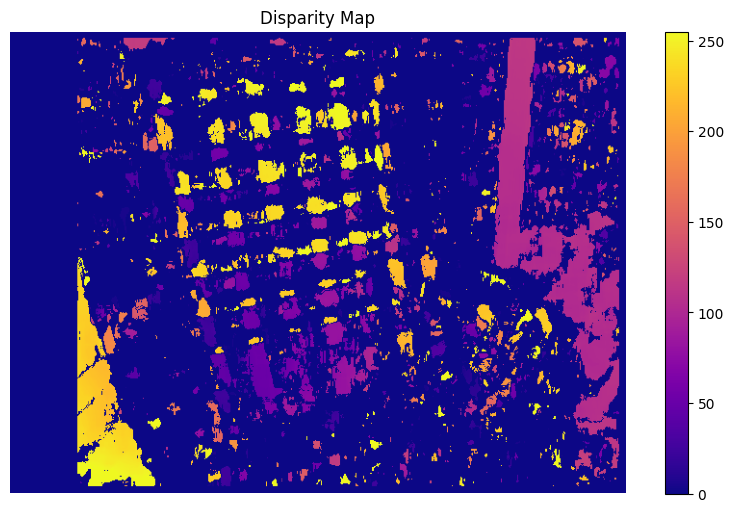

In [7]:
# Convert rectified images to grayscale 
gray_left = cv2.cvtColor(left_rectified, cv2.COLOR_BGR2GRAY)
gray_right = cv2.cvtColor(right_rectified, cv2.COLOR_BGR2GRAY)

# Create StereoBM or StereoSGBM object
stereo = cv2.StereoBM_create(numDisparities=64, blockSize=15)

# Compute disparity map
disparity = stereo.compute(gray_left, gray_right)

# Normalize the disparity map for better visualization
disp_norm = cv2.normalize(disparity, None, alpha=0, beta=255,
                          norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

plt.figure(figsize=(10,6))
plt.imshow(disp_norm, cmap='plasma')
plt.title("Disparity Map")
plt.colorbar()
plt.axis('off')
plt.show()


- `cv2.normalize`: Normalizes the values of an array according to a specified norm type and scales them to a given range. Commonly used to adjust image intensity values or disparity maps for visualization or further processing.
- `cv2.NORM_MINMAX`: A normalization type used with `cv2.normalize` to scale the input array elements so that they fit within a specified range (usually [0, 1] or [0, 255]). It linearly maps the minimum and maximum values of the input to the desired range.
- `cv2.StereoBM_create`: Creates an instance of the Stereo Block Matching (StereoBM) algorithm object, which is used for computing disparity maps from stereo image pairs. 


### Save Stereo calibration data

Saving stereo calibration data involves storing intrinsic camera matrices, distortion coefficients, rotation and translation vectors, rectification transforms, projection matrices, and disparity-to-depth matrix (Q), Rectification transforms (R1, R2),Projection matrices (P1, P2), Rotation matrix (R) and translation vector (T). 

In [8]:
np.savez('stereo_calib_data.npz',
         cameraMatrix1=cameraMatrix1,
         distCoeffs1=distCoeffs1,
         cameraMatrix2=cameraMatrix2,
         distCoeffs2=distCoeffs2,
         R=R, T=T, R1=R1, R2=R2, P1=P1, P2=P2, Q=Q)

print("Stereo calibration data saved to stereo_calib_data.npz")


Stereo calibration data saved to stereo_calib_data.npz
